# 1. Java Review

## 1.1. Visibility Modifier

For this course, we only look at "Public" or "Private" modifier
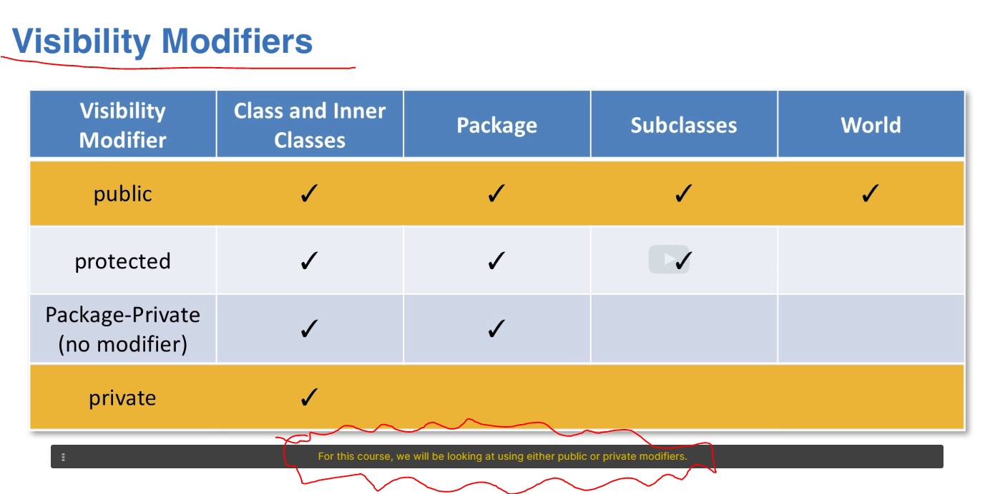

## 1.2. Constructor

- In this 1st example, we set x = a, y = b where a and b will be the user defined input parameters when initiate this "Point" class
- In the 2nd example, when user input parameter (Double x, Double y) have the same name as instance variable declared by class "Point", then we need to use "this.x"/"this.y" to differentiate between x,y instance variable from current class vs. x,y input parameter. "this.x","this.y" means x,y as instance variable from current class.
    - "this." is only needed when we have the same name as above 2nd example.
    
    
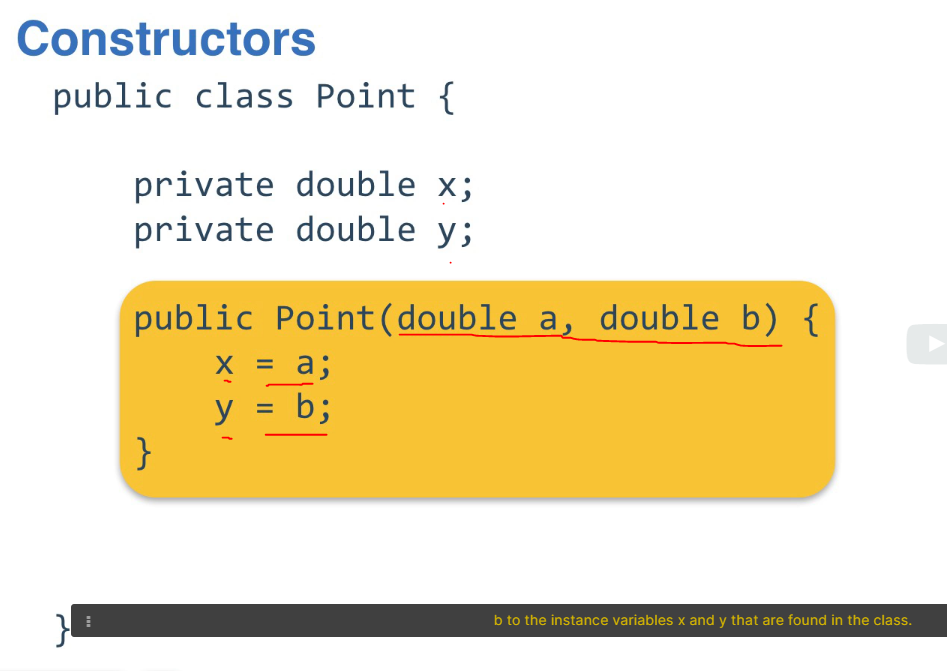

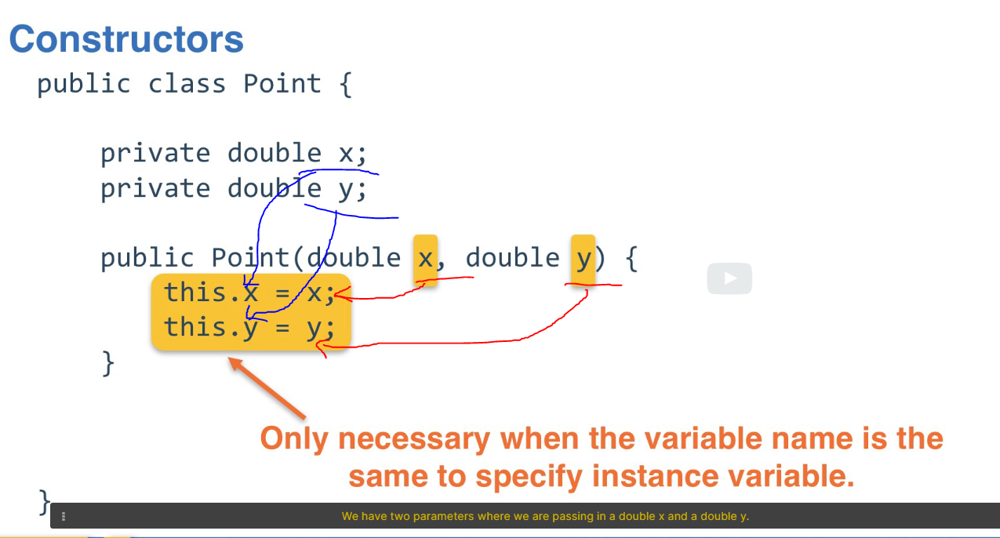

### 1.2.1. Constructor Chaining

- In the example below, you can see the second constructor "Point (double a)" utilize the constructor chaining "this(a,0);"

- The real purpose of Constructor Chaining is that you can pass parameters through a bunch of different constructors when instantiate a Class, but only have the initialization of instance variable done in a single place. **This allows you to maintain your initializations from a single location, while providing multiple constructors to the user**. Thus improve the readibility of the code.

- For example below, if user is to instantiate class "Point", and he wants to only provide one input parameter (e.g. a) instead of two, then the 2nd constructor is invoked automatically because the user input parameter matches 2nd constructor's input parmater's format.
    - Under 2nd constructor, by using "this(a,0)", this line will automatically invoke the 1st constructor because it has two parameters (a,0) which matches 1st constructor's input parameter format, and it will pass (a,0) to (double x, double y). And then under 1st constructor, this.x will be assigned as "a", and this.y will be assigned as 0
    - The benefit of constructor chaining here is that: you don't need to re-define the this.x, this.y under 2nd constructor again, you can directly utilize 1st constructor's setup.


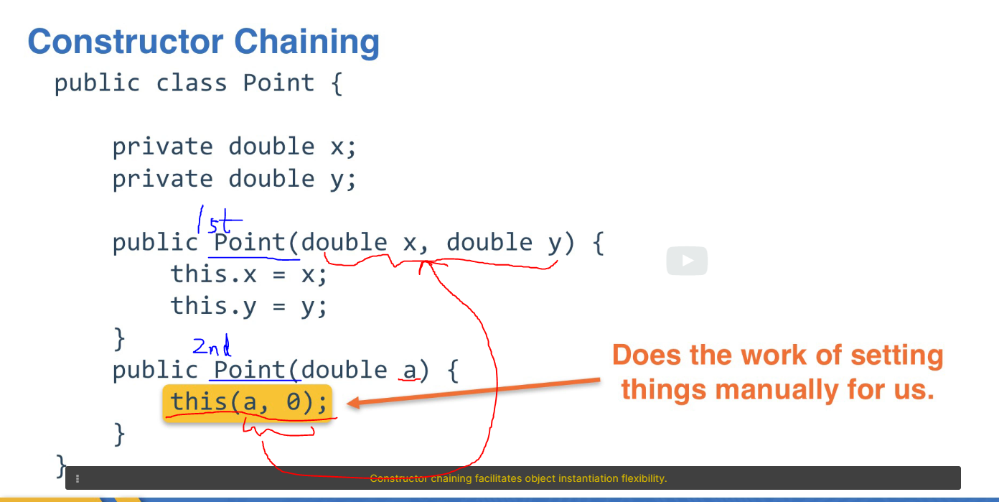

## 1.3. Equality, Primitives and its Wrapper Objects, and Strings

### 1.3.1. Two types of Equality checking

- Reference Equality: 
    - Checks if two objects are the exact same object in memory (i.e. they occupy the same memory). In Java, this is done through the == operator.
    - This typical use for this equality is rare in this course; the primary way we'll use this operator is to check if an object is null, which denotes an empty/exceptional object.

- Value Equality:
    - This is totally based on how user defines the value equality, depending on use case.
    - In Java, user can override .equals() methods to define their own definition of comparing value equality of two objects.
        - .equals() method is inherited from Object class.
    - But by default, if user does not override this method, a.equals(b) method is the same as a == b


### 1.3.2. Primitives

- Primitive types in Java
    - int
    - long
    - double
    - char
    - ......

- Primitive types DO NOT extend "Object" class, therefore they cannot use ".equals()" method.
- The only way to compare them is to use "==" to check equality
- For Primitive, there is no difference between value vs. reference equality

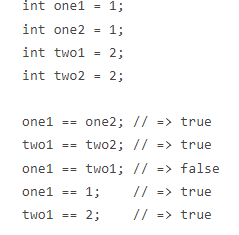

### 1.3.3. String Object vs. String Literals/Constants

- Two ways to create a String
    - Create string literals/constants by simply using: e.g. String str_literal = "This is a string.";
    - Create string object by using "New": e.g. String str_object = new String("This is a string.");
    
    
- String Literal/Constant
    - This method just creates literals/constants that are stored in a String pool for faster access.
    - Strings created in this way act very similarly to primitives in that there is **no difference between value/reference equality!** 
    - But unlike primitive types, since this method creates the String type, which extends Object, you can alternatively use the .equals() method if you want instead.
    
- String Object
    - This method is like how you create object for all other objects.
    - It's like any other Object in terms of value/reference equality, allowing you to differentiate between the two based on whether you use .equals() or ==. 

- Example of Reference Equality of different string methods (see below screenshot)
    - 1. string created by literal references the different memory location than created by "new" constructor (that's why you see "False" below for literal == object;
    - 2. string created by literal references the literal pool, so it returns true when comparing literal == "this is a string."
    - 3. Everything you create an object using "New", it creates a new memory location, so that's why it is False when object == new String ("This is a string."); 

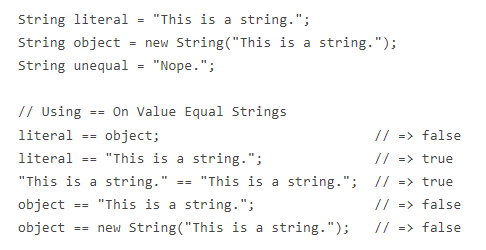

### 1.3.4. Primitive Types' Wrapper Objects

- Each of the primitive types have a wrapper Object class (i.e. int -> Integer, double -> Double, etc.).
- Use case: For example, generic typings implictly require the type to inherit from the Object class, meaning that if you wanted to make some Collection of ints, then you'd need to make Integer objects to add rather than primitives int. 
    - If you've never noticed this before, that's because Java has features like autoboxing/unboxing in order to streamline the experience.

- Similar to String Object vs. String Literal/Constant, Wrapper Objects vs. Primitive Type have the similar behavior regarding the value/reference equality, except:
    - For example below (in red star): "Wrapper Object == 1" returns True for reference equality, whereas "String Object == "This is a string." returns False for reference equality (see above section 1.3.3.)
    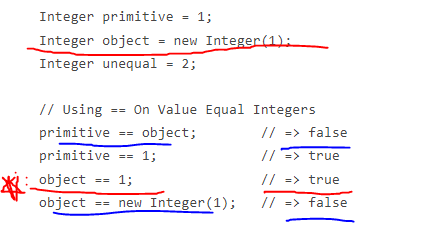
    

## 1.4. Pass by Value (Java) vs. Pass by Reference (some other languages)

This has been briefly covered in Course OOP_JavaI -> Module 2 L4 -> "Pass By Value:" section

- **Pass By Value** - The method **copies** the value of what was passed in. Changing its value within the method will change the value of the local variable (i.e. within the method), but not the value of the original variable.
- **Pass By Reference** - The method takes in the reference for what was passed in. Changing its value will change the value of both the local variable and the original variable (because they reference the same location in memory).

> Java is a "Pass by Value" language

### 1.4.1. Pass By Value with Primitive Types Variable

For example below:
- The primitive types variable "int count" was passed to helper() method
- Since Java is Pass By Value language, int count's value is **copied to** int x, and then although int x's value is changed inside the helper method by x = x+1, the original int count's value is not changed.
- Therefore, the main method's count is still 0 in the end.
- If it is a "Pass by Reference" language, the end output of count will be 1.
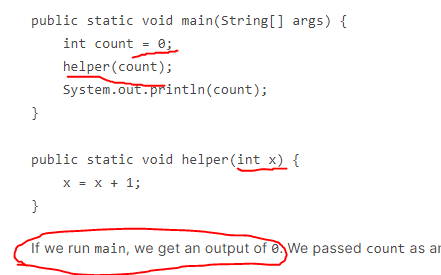

> The only way to mimic "Pass by Reference" language behaviour to primitive type variable is to add a return to method, and re-assign the original primitive type variable to method's return value.
> - Example: below example will print 1 under "main"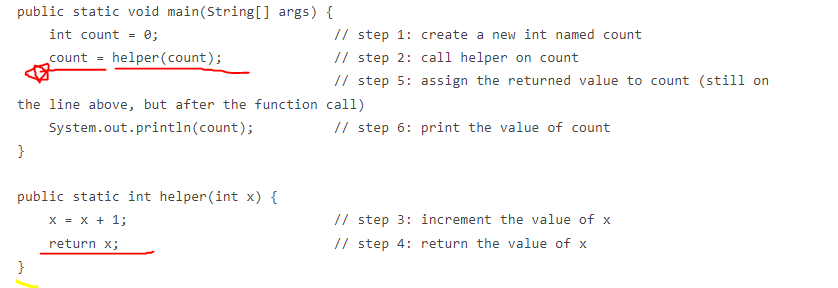

### 1.4.2. Pass by Value with Reference Variable

- For reference variable, you need to remember the "value" copied in "Pass by Value" is the "Address" (i.e. pointer) of the reference variable, not the actual content/memory of the reference variable.
- So technically, in example 1 and 2 below, "Container x" from helper method **copied the address** of "Container count" from main.(This is still called "Pass by Value" because address value is copied).
- But the result is that: "x" and "count" are alias to each other since they point to the same memory address.
- Therefore, in example 1 below, if we directly modify "x" without changing its address, the "count" will also change (i.e. output print is 1)

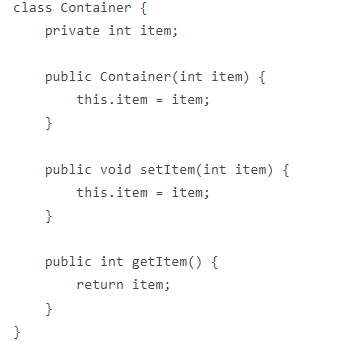
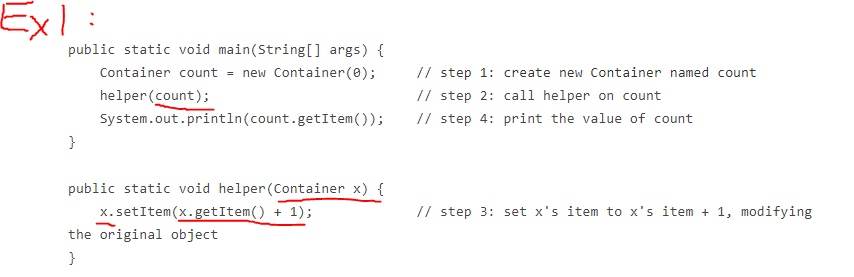



- But in example 2 below, if we point "x" to another reference (since address value is copied from "count", so modifying x's address won't modify "count"'s address), and modify that new object, then "count" will not change because right now "count" and "x" are pointing to two different addresses, not alias anymore. (i.e. output print is 0)
    - In contrast, in example 2 below, if it is "Pass by Reference" program language, the output will be 1. (i.e. the addresses of the count and x are linked)
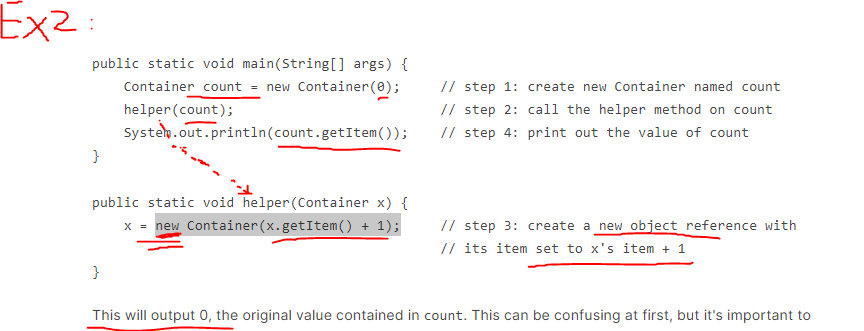
    


## 1.5. Generics/Generic Class (Type Parameter) 

- Purpose of Generics:
    - Sometimes when writting class in Java, we would like to create classes that work with different data types, and we don't define the type upfront.
    - So we use generics as type (i.e. pass a Type Parameter to class)
    - And when actually using the class, user can define what type they would like, e.g. String, Integer, ..., or some new type the user defines.

- This type of class (with **Type Parameter**) is called **"Generic Class"**

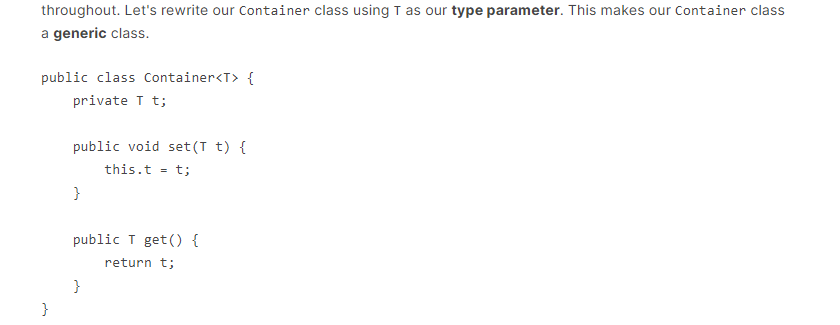

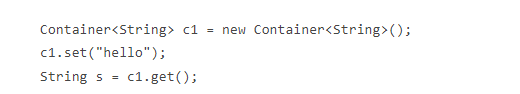

### 1.5.1. Generic Arrays

- Declaring/Instantiation of a regular Array: (see OOP_JavaI -> Module 4 L8 Notes)


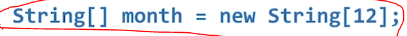


- Declaring/Instantiation of generic Arrays:
    - Java does not allow us to directly create generic arrays
    - We need to: 1. first create a regular array of "object" type; 2. cast to generic type, e.g. T
    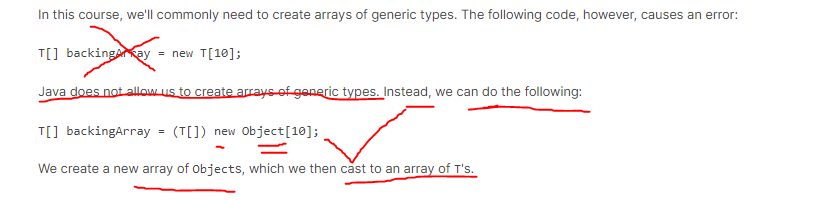
    


## 1.6. Iterable and Iterator

### 1.6.1. Iterator Interface (not covered in previous OOP_Java course)

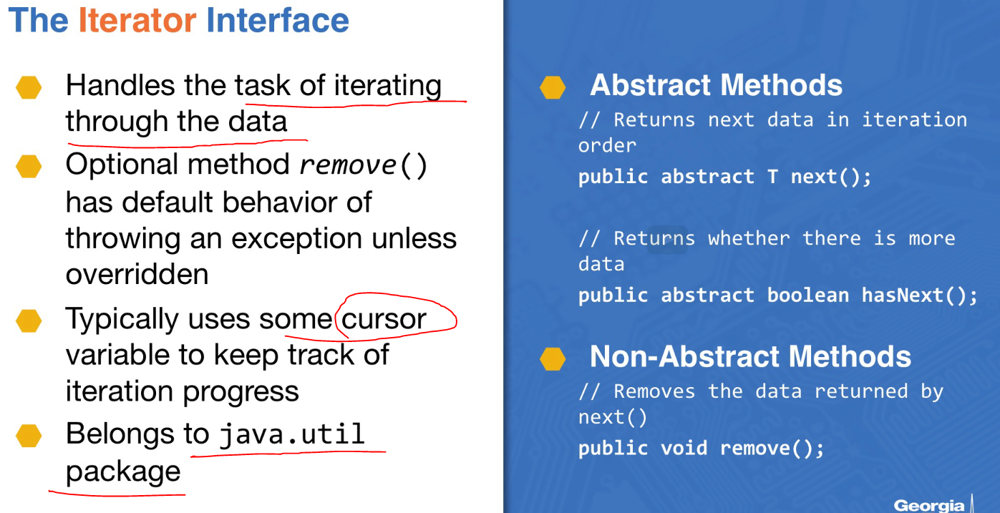

Example:

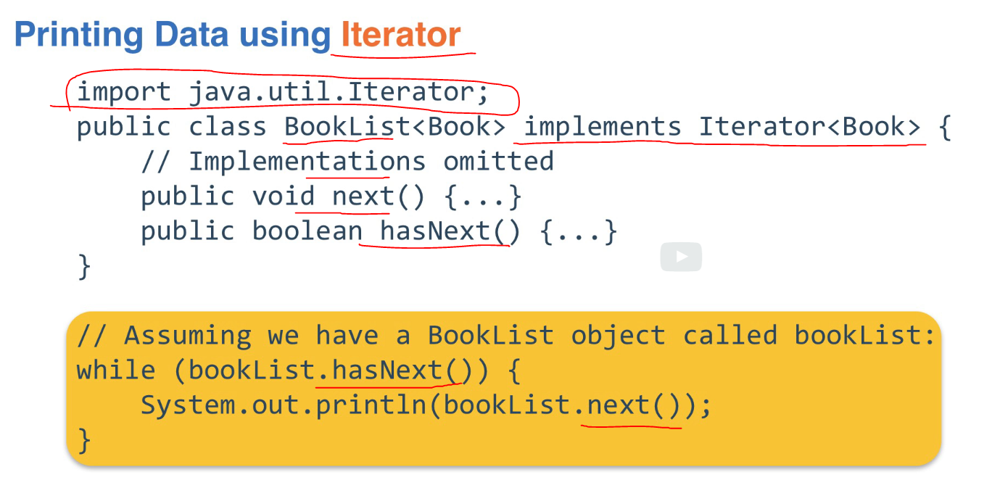

### 1.6.2. Iterable Interface (not covered in previous OOP_Java course)

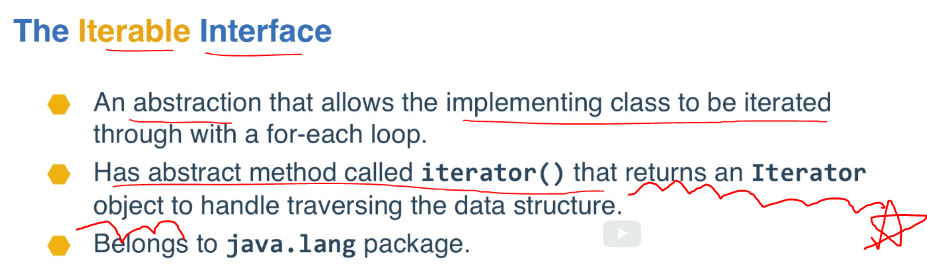

Example:


- In below example:
    - 1. Point 1 indicated below: Iterable interface does not need to be imported explicitly because it is in java.lang package. But to properly override "Interator" abstract method inside Interable interface, we still need to import Iterator. [Note: Iterator abstract method inside of the Iterable interace is actually linked to Iterator Interface.]
    - 2. Point 2 indicated below: When implement/complete Iterator abstract method, you need to specify the return type "Iterator\<Book>" because as indidated in slide above, iterator() method returns an Iterator object.
    - 3. For the point 3 indicated in the two screenshots below, we can use two methods as indicated in 1st and 2nd screenshot below: 
        - a. define a variable that takes the return from iterator() method, i.e. "bookIterator" below, then use .hasNext() and .next() method to iterate through it similar to how you did in typical iterator interface (example above).
        - b. If the bookList object is iterable, we can directly use for-each loop to iterate all values without needing to directly call any of the iterator methods. (This for-each loop internally uses an Iterator)
    
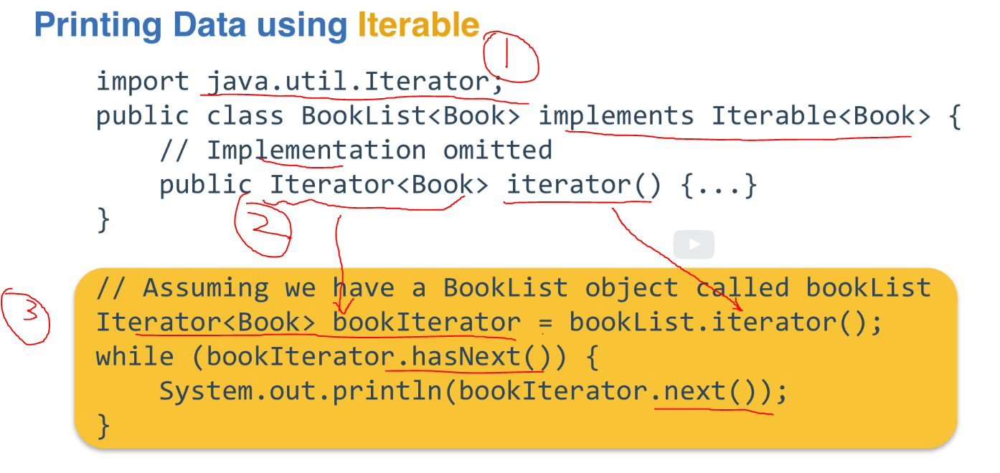

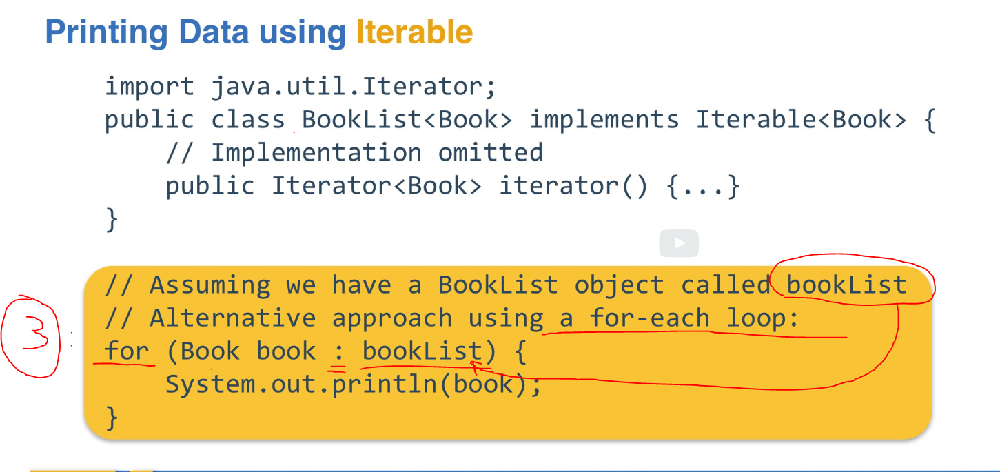

> Difference between Iterable vs. Iterator interface: 
> - Iterable is dependent on Iterator
> - But Iterator is independent on Iterable
> - Iterator interface gives us **direct control** over how many and when we traverse through the data structure.
> - https://www.techiedelight.com/differences-between-iterator-and-iterable-in-java/

> In this course, we won't expect you to implement Iterator or Iterable. Instead, you might have to use a for-each loop to iterate efficiently through Java collections like ArrayList and LinkedList.
> - ArrayList and LinkedList classes implement Iterable for us already
> - A full list of which classes implement Iterable already: https://docs.oracle.com/javase/8/docs/api/java/lang/Iterable.html

> In addition, using a for-each loop can be sometimes more efficient than a regular for loop.
> - Note: in OOP_Java course, we only covered regular for loop not for each loop. (OOP_JavaI -> Module3_L7)
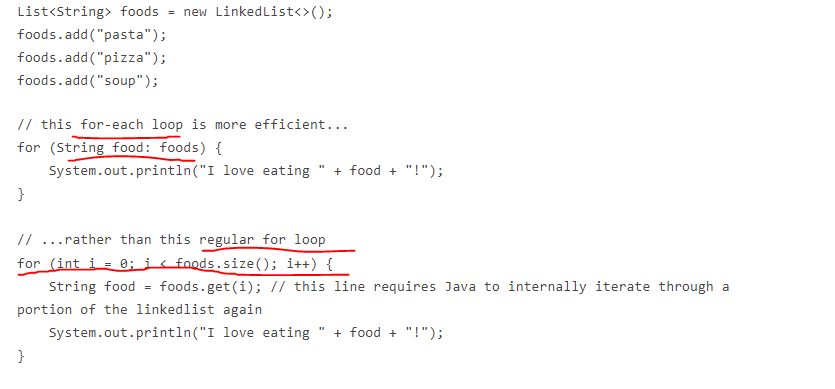

## 1.7. Comparable and Comparator

> Unlike Iterable and Iterator inteface, Comparable and Comparator Interface are totally independent from each other. Neither needs the other to operate.

### 1.7.1. Comparable Interface

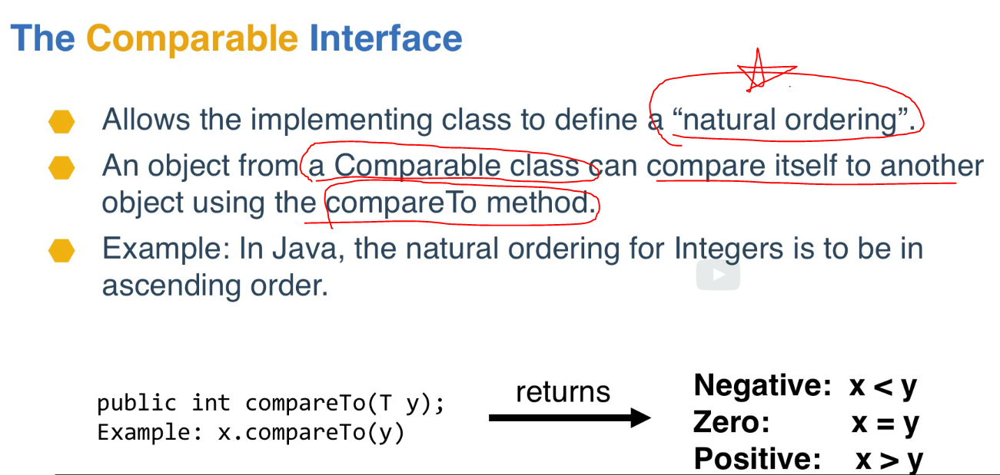

Example:
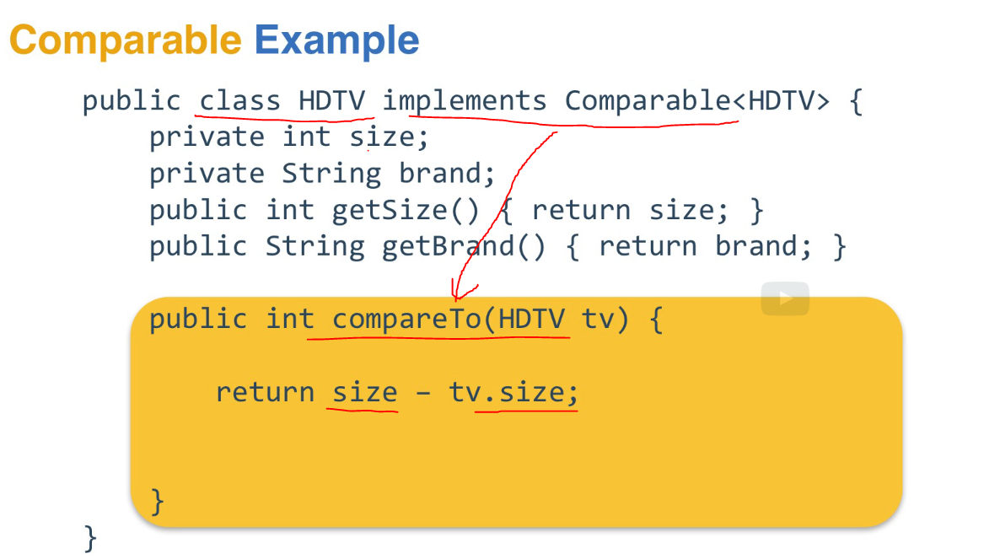

> Note: compareTo() method is completed **within** the object class because object class directly implement Comparable Interface (that's how Comparable Interface works)!!!

### 1.7.2. Comparator Interface

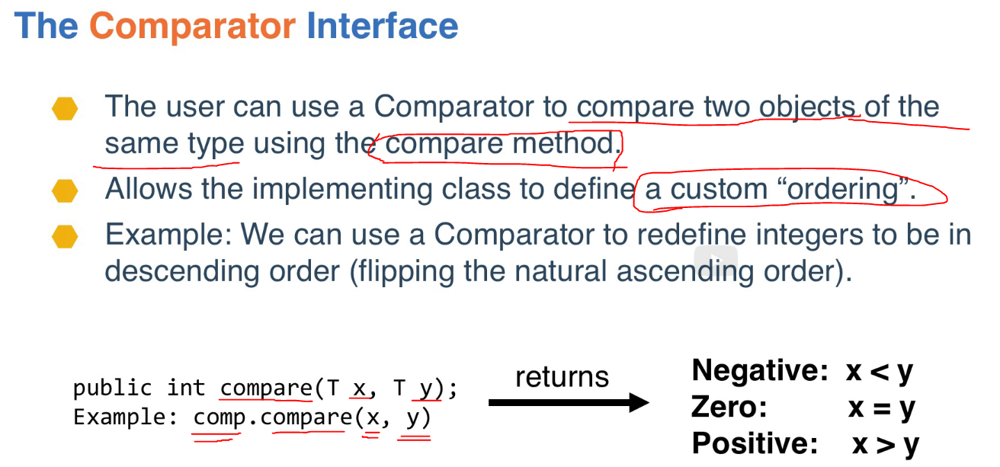

> Note: 
> - 1. When using comparator's compare() method, we do not implement the interface **within** the object x, y's class itself. (see 2nd example below)
> - 2. Instead, we create another class to implement comparator interface (see 2nd example below, also see "comp" object above: it should be an instance of that separate class that implements comparator interface, which is independent from x,y's object class)
> - 3. That' why you see object x, y are BOTH passed as the input parameter to compare() method, rather than seeing x.compare(y) like compareTo() method inside the Comparable interface above.

**Benefits of using Comparator Interface vs. Comparable Interface:**
> - For example 1 below, we are comparing student A to student B from Student class. But we have many attributes to compare between two students, e.g. name, age, major, grade, ......
> - If we are using comparable interface, we can only define one attribute to compare between two students because compareTo() method will be completed within the "Student" class itself based on "Comparable" interface's syntax.
> - However, if using Comparator interface, we can define several separate classes that implement Comparator Interface, **outside of Student class**, e.g. NameComparator, AgeComparator, MajorComparator, etc...
> - In that case, we can customize what attribute we want to compare within each separate classes.

> - **To summarize, if sorting/comparison of objects needs to be based on natural order (i.e. only one default attribute of object class) then use Comparable whereas if your sorting/comparison needs to be done on several attributes of object class, then use Comparator in Java.**
> - https://www.geeksforgeeks.org/comparable-vs-comparator-in-java/

Example 1:
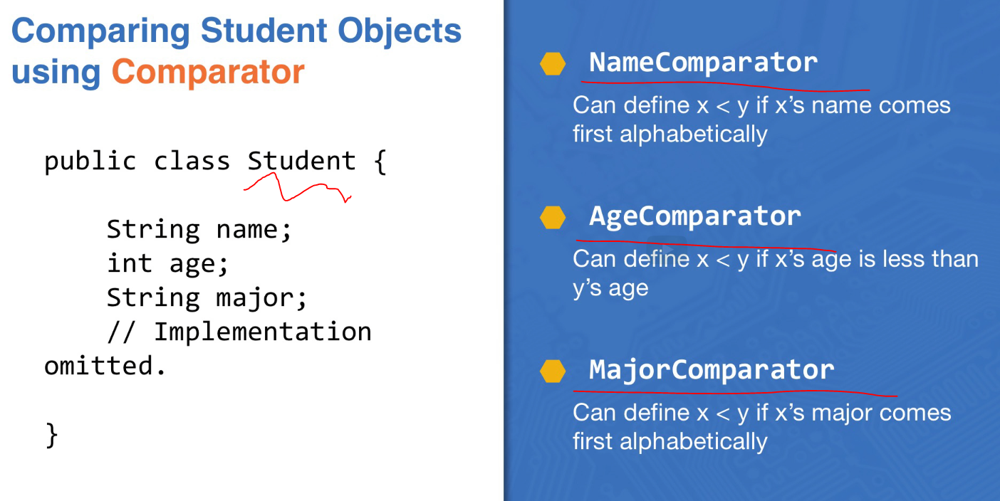

Example 2: Example of how to implement the comparator interface in a separate class

- Point 1: Since Comparator interface is NOT in java.lang, so we need to explicitly import it
- Point 2: We define a class that implements Comparator interface OUTSIDE of object class HDTV
- Point 3: We complete the abstract method "compare()" within the separate class above. And this class/method is to specifically compare the size of two HDTV objects.
- Point 4: Since we are outside of HDTV class, we need to use getter methods (e.g. .getSize() here) defined within HDTV class, to get the attributes (e.g. size) of the object. The rest of the logic to complete the compare() method is the same as how you complete the compareTo() method when implementing Comparable Interface. 

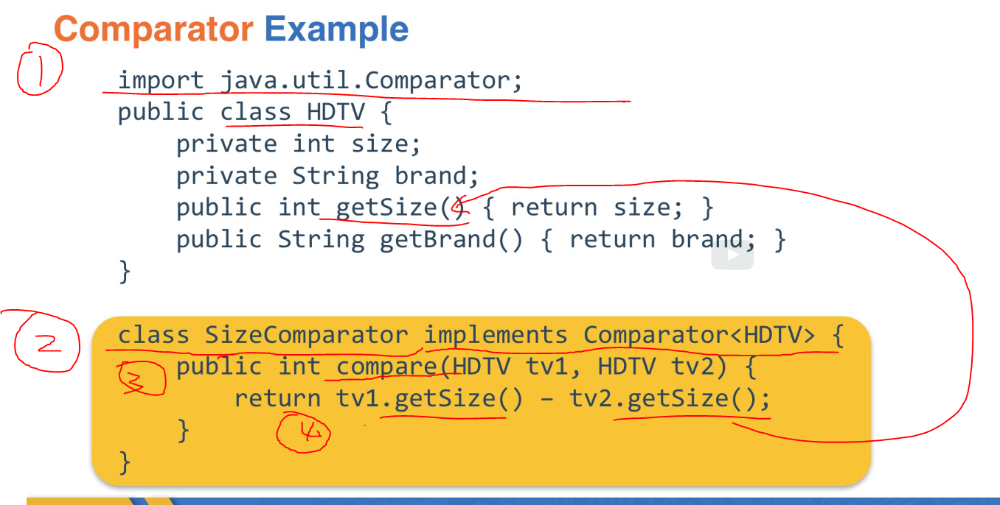



# 2. Complexity Big-O

> FYI: CS Famous P!=NP problem https://www.youtube.com/watch?v=EHp4FPyajKQ&ab_channel=UpandAtom

## 2.1. Definition of Complexity of an Algorithm

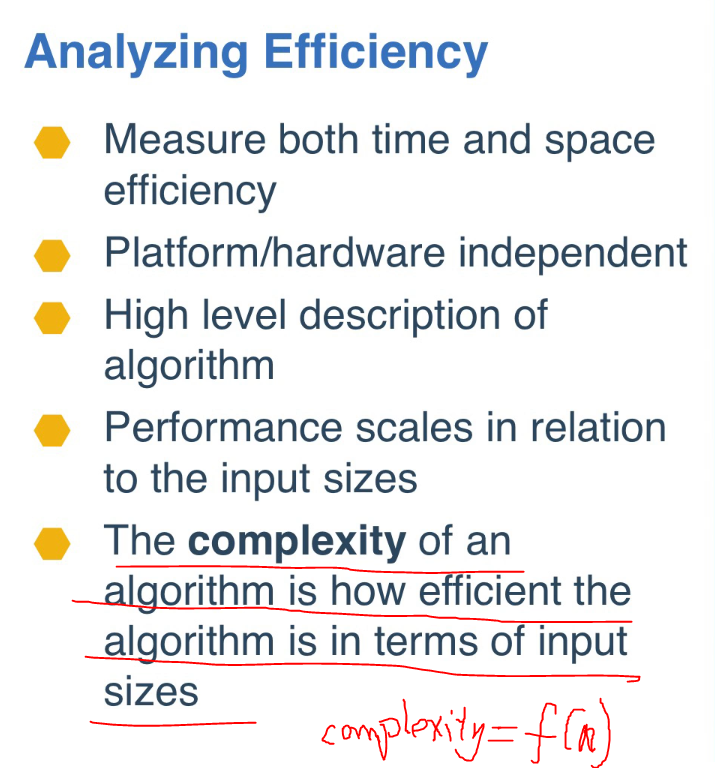

- Time Complexity can be quantified by a function of input size n. i.e. Time complexity = f(n)


- In this course, we usually focus more on time complexity rather than space complexity.

## 2.2. How to calculate Time Complexity

Step 1: Break down the operations of algorithms to fundamental pieces (low-level instructions), aka. **Primitive Operations**.
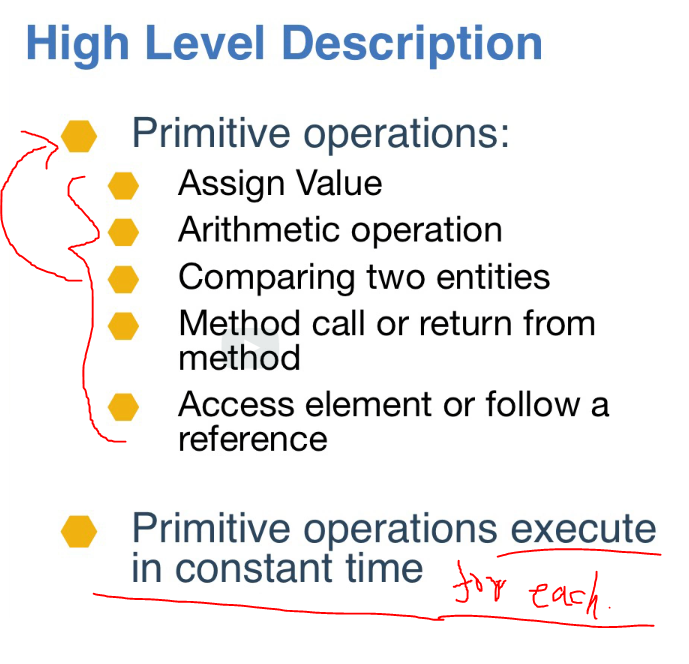


Step 2: Count the # of primitive operations in an algorithm. This will correlate the runtime of the algorithm

> Note: 
> - However, it is always important to keep in mind your use case and what you are modeling. The assumption that primitive operations operations can be done quickly is only valid if you are working with manageable, small units. For example, suppose we are multiplying two integers, which pretty simple to write code for in Java. If your numbers are small enough that they fit into an int (32-bit) or a long (64-bit) typing, then the multiplication will be fast since Java optimizes computations with primitive types. However, if your numbers are very long, then the length of your numbers may pose a significant computational task since there is no longer a simple low-level instruction that can do it for you!
> - For this course, we will keep it simple and stick with the **assumption that each of the primitive operations are truly O(1) operations.**

## 2.3. Big-O notation:

When measuring the time complexity of an algorithm above, we have three cases, the worst case is called Big-O

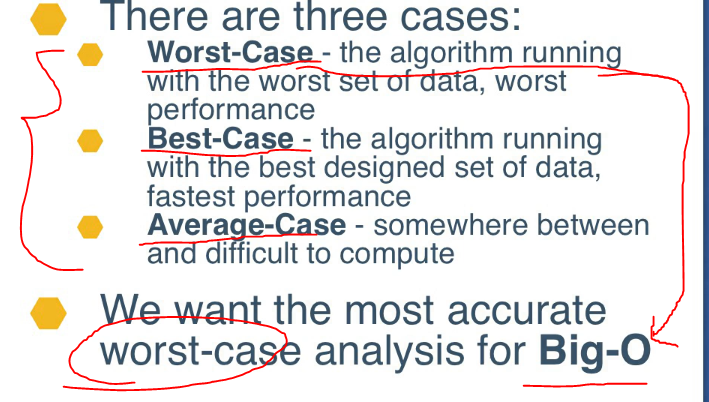


Notation:

- Big-O:
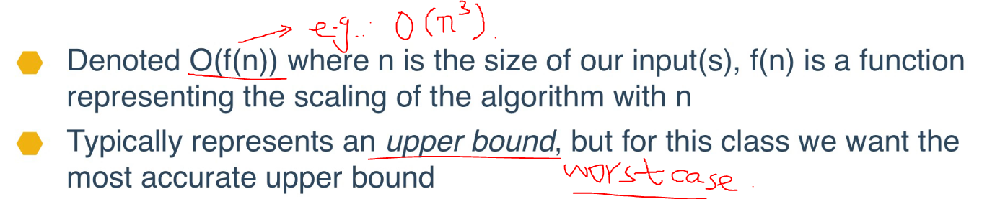

- There are other measures/notations but will not be covered in this course
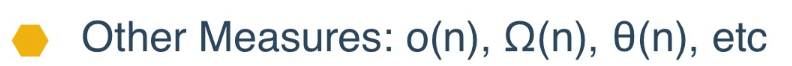

## 2.4. Common Practice of Big-O

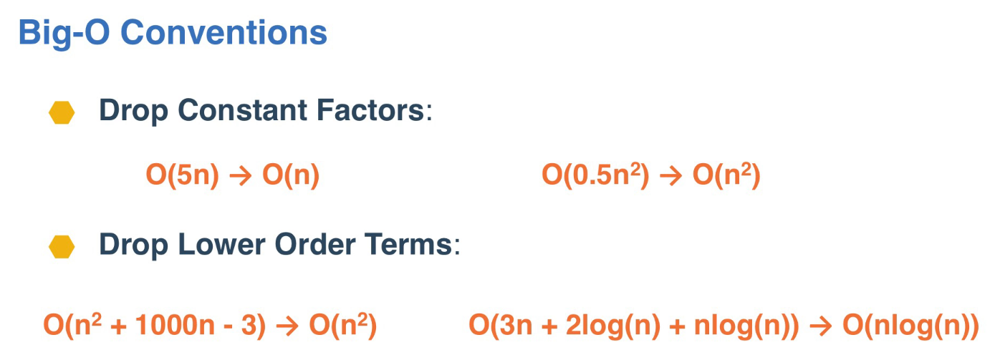

> Why we can drop constant factors and lower order terms?
>- Because Big-O measures the worst case and upper bound, i.e. measure the runtime when input size n -> infinite.
>- When n -> infinite, since Constant factors do not grow, so they are not needed to depict that growth, and lower order terms are dominated by higher order ones as the input grows.


> However!!! This works from a theoretical perspective of efficiency, but in practice, we often do need to take these things (e.g. constant) into account. (But in this course, we only focus on the theoretical perspective of Big-O)
>- 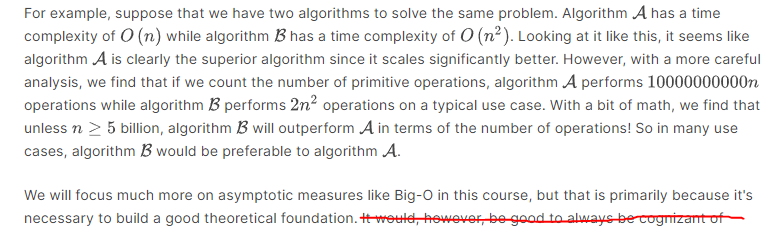

## 2.5. Common Time Complexity

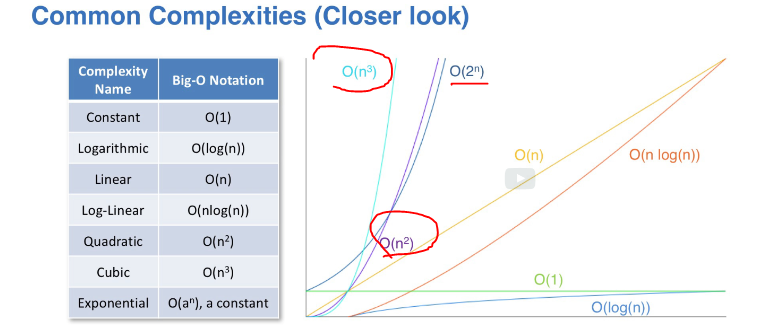

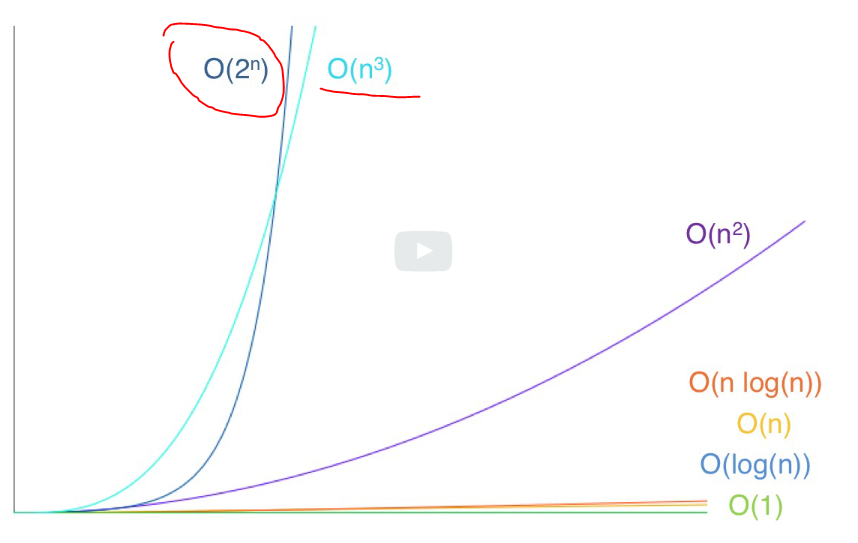

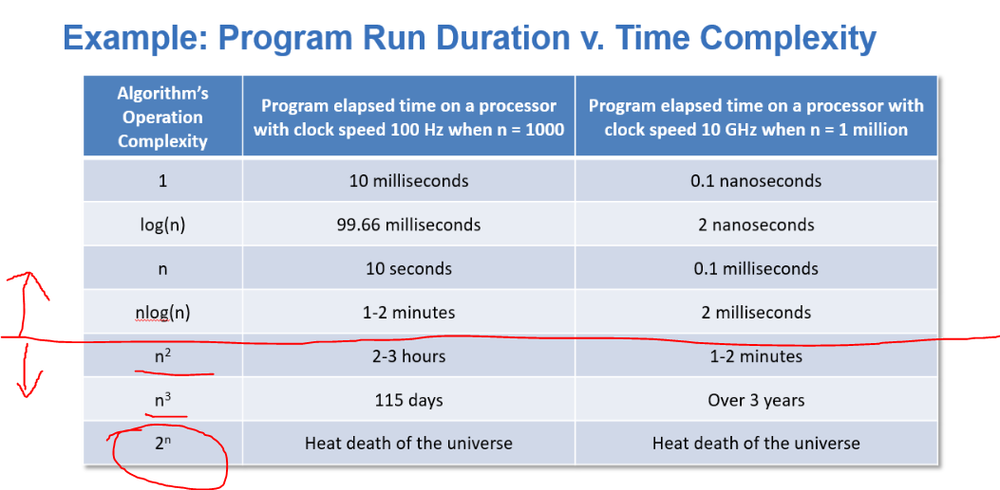

**Note for O(log(n))**
- In computer science, log(n) is usually based off base=2, i.e. log2(n). But it really doesn't matter in Big-O, because any base (e.g. m) of log(n) can be converted to a constant C * log2(n), therefore the same time complexity as O(log(n))


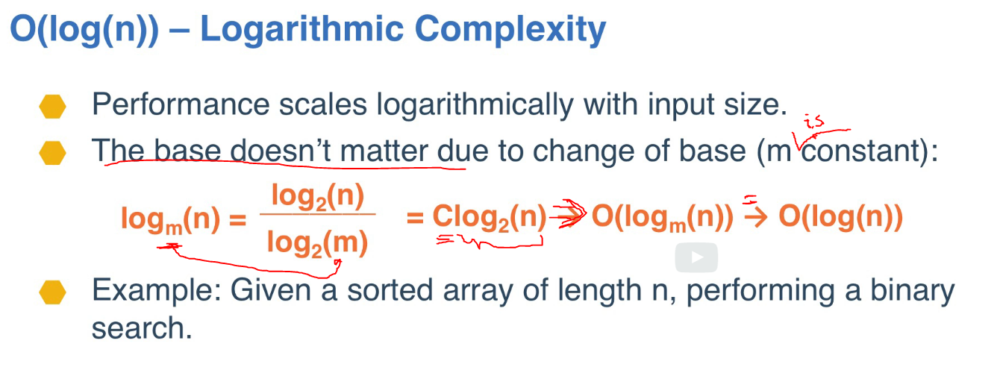


